# 3. VIEWS

## Before Topic : 

### DataBase Top-to-Bottom : 

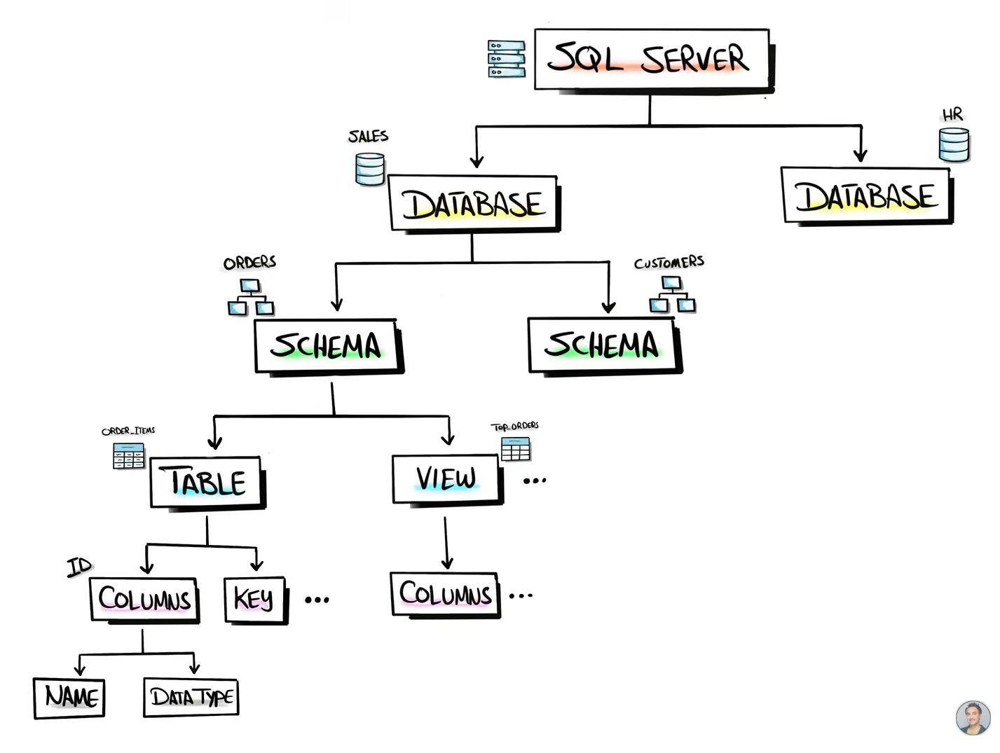

### 3-Level of DATABASE ARCHITECTURE :

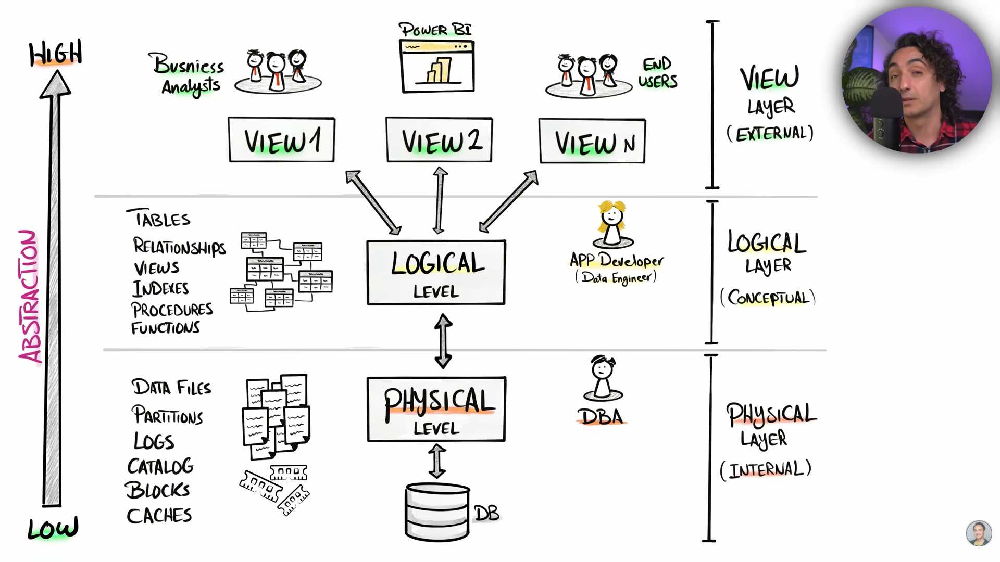

## Intro : 

### Definition :

#### VIEW :

```
VIEW : Also known as virtual table 
    1. Virtual Table based on the result set of a query, without storing the data in database
    2. Views are persisted SQL queries in the database.
```

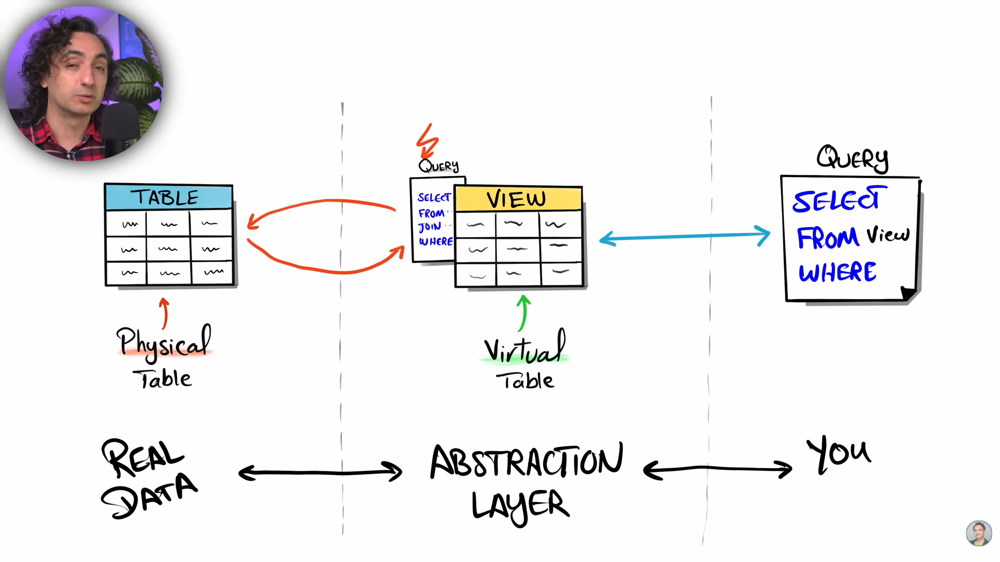

### VIEW vs TABLE :

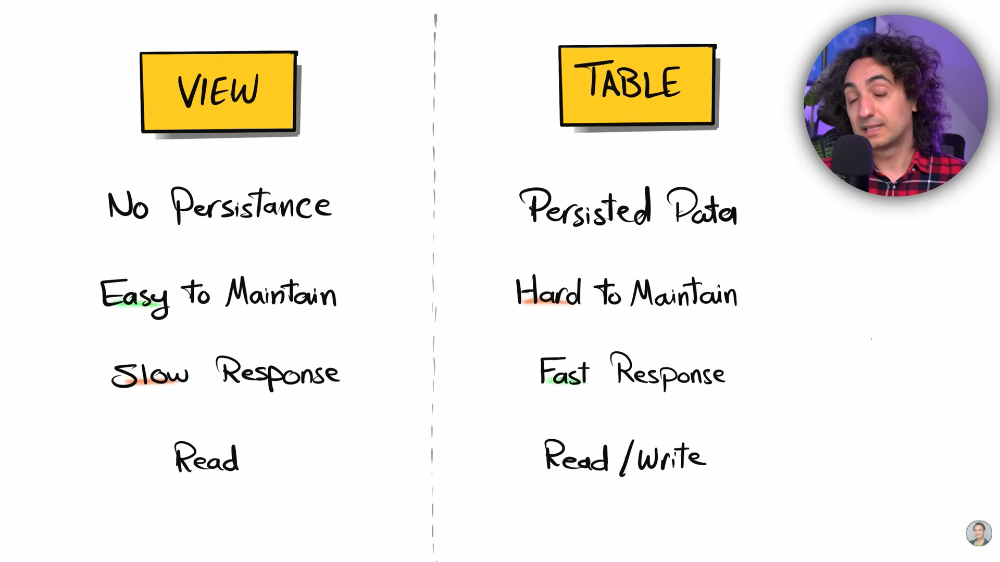

### VIEW vs CTE :

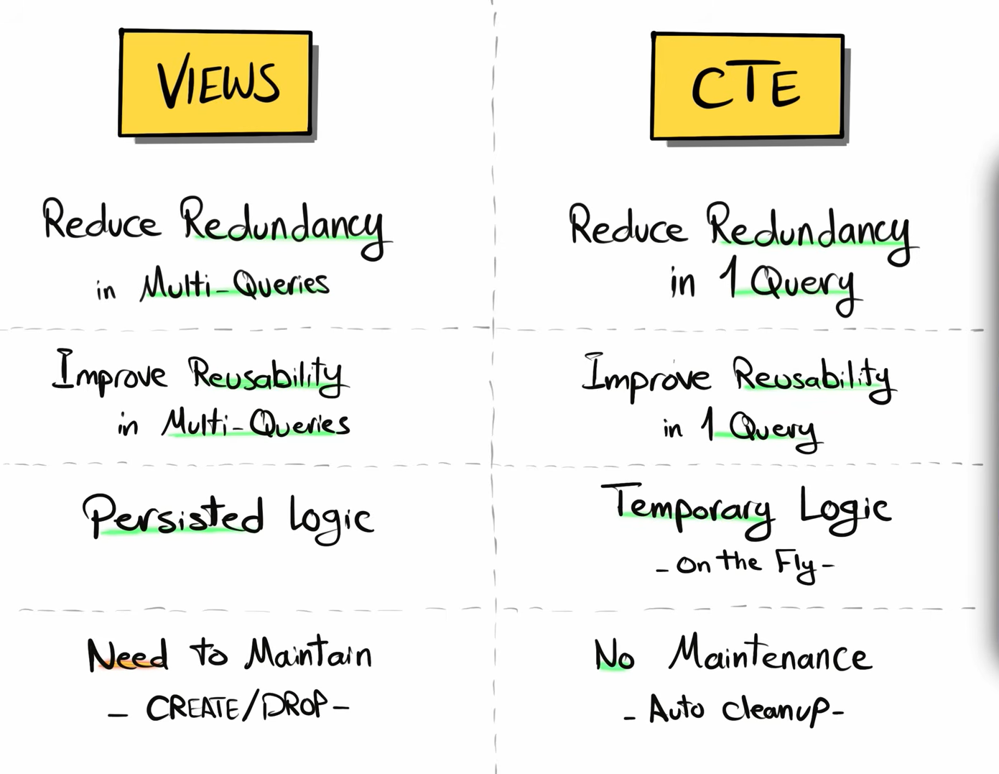

### How DataBase EXECUTES view?

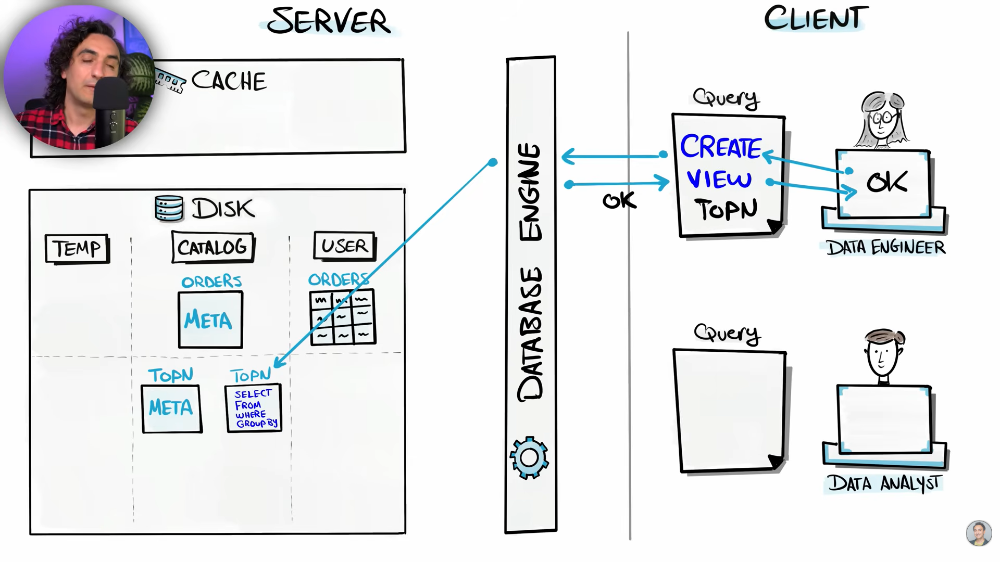

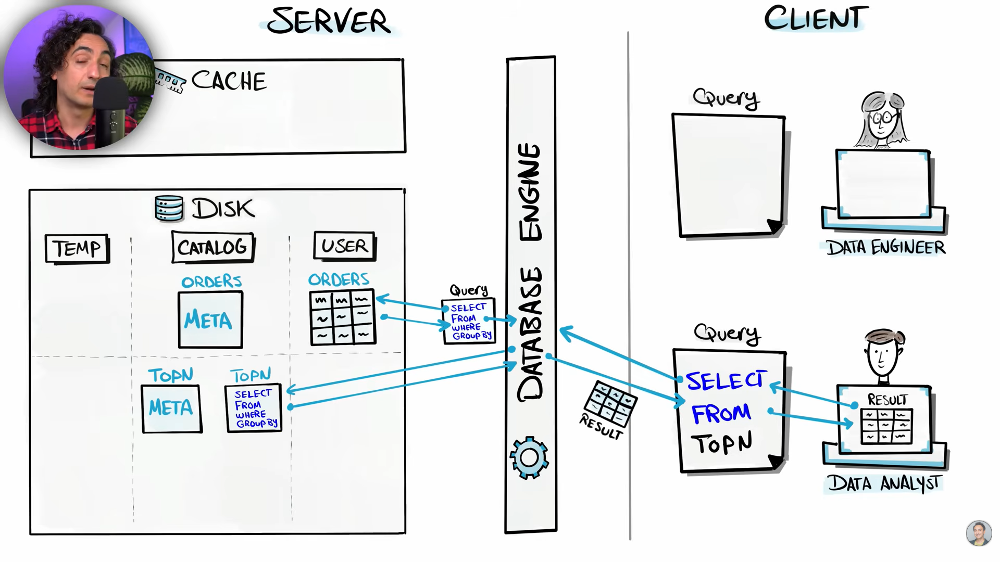

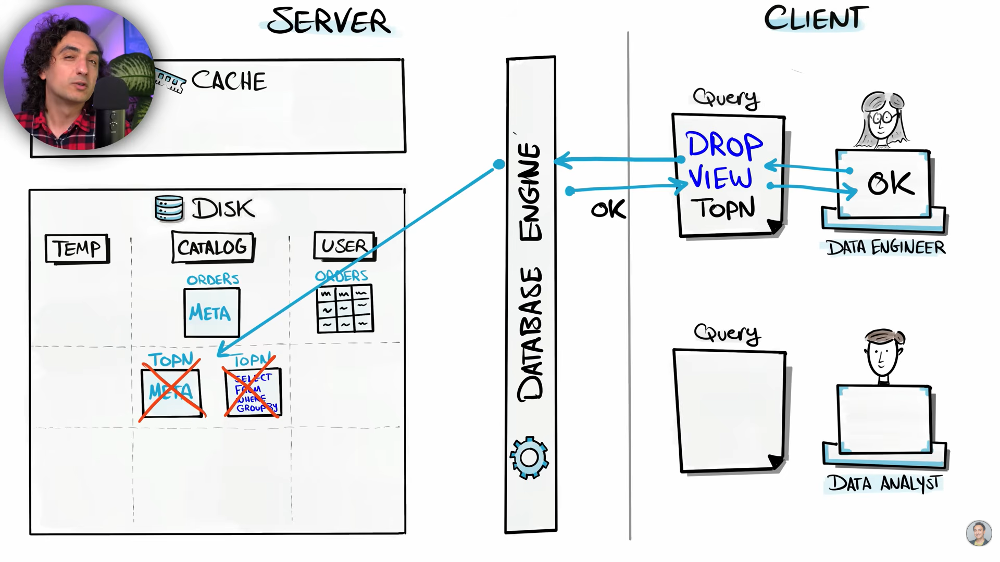

## SQL VIEWS COMMANDS : 

### 1. CREATE : 

#### Syntax : 

```
CREATE VIEW viewName AS (
    SELECT ...
    FROM ...
    WHERE ...
)
```

#### Challenges : 

##### 1. Find the running total of sales for each months

In [101]:
%%sql
--USING CTE
with Monthly_Sales as (
    select monthname(orderdate) as Months,
        sum(sales) as TotalSales,
        count(orderid) as TotalOrders,
        sum(quantity) as TotalQuantities
    from orders
    group by monthname(orderdate)
)
select *,
    sum(TotalSales) over(
        order by Months
    ) as RunningTotal
from Monthly_Sales;

-- USING SUBQUERY
select *,
    sum(TotalSales) OVER(
        order by Months
    ) as RunningSales
from(
        select monthname(orderdate) as Months,
            sum(sales) as TotalSales
        from orders
        group by monthname(orderdate)
    ) as monthlySales;

Running query in 'mysql+pymysql://'

3 rows affected.

3 rows affected.

Months,TotalSales,RunningSales
February,195,195
January,105,300
March,80,380


##### 2. CREATE VIEW for the CTE logic of above 

In [107]:
%%sql
CREATE VIEW Monthly_Summary AS (
    select monthname(orderdate) as Months,
            sum(sales) as TotalSales,
            count(orderid) as TotalOrders,
            sum(quantity) as TotalQuantities
        from orders
        group by monthname(orderdate)
);

Running query in 'mysql+pymysql://'

++
||
++
++

In [108]:
%%sql
select * from Monthly_Summary;

Running query in 'mysql+pymysql://'

3 rows affected.

Months,TotalSales,TotalOrders,TotalQuantities
January,105,4,6
February,195,4,8
March,80,2,2


In [116]:
%%sql
SHOW FULL TABLES

Running query in 'mysql+pymysql://'

6 rows affected.

Tables_in_salesdb,Table_type
Monthly_Summary,VIEW
customers,BASE TABLE
employees,BASE TABLE
orders,BASE TABLE
orders_archive,BASE TABLE
products,BASE TABLE


In [117]:
%%sql
DROP VIEW Monthly_Summary

Running query in 'mysql+pymysql://'

++
||
++
++

In [118]:
%%sql
SHOW FULL TABLES

Running query in 'mysql+pymysql://'

5 rows affected.

Tables_in_salesdb,Table_type
customers,BASE TABLE
employees,BASE TABLE
orders,BASE TABLE
orders_archive,BASE TABLE
products,BASE TABLE


### 2. UPDATE : 

#### Definition : 

##### T-SQL : Transact-SQL is an extension of SQL that adds programming features (only use in MS SQL)

#### Syntax : 

##### MySQL : 

```
CREATE OR REPLACE ViewName AS(
    SELECT oldCol1, oldCol2, ..., newCol1
    FROM tableName
    WHERE ....
)
```

##### MS-SQL using T-SQL : 

```
IF OBJECT_ID ('ViewName', 'V') IS NOT NULL
    DROP VIEW ViewName;

GO

CREATE VIEW ViewName AS (
    SELECT ....
    FROM ....
    WHERE ....
)
```

#### Challenges : 

##### 1. Make an update script for the create table above

In [121]:
%%sql
create view u_monthly_summary as (
    select monthname (orderdate) as Months,
    count(*) as TotalOrders,
    sum(sales) as TotalSales,
    sum(quantity) as TotalQuantity
    from orders
    group by monthname(orderdate)
);

Running query in 'mysql+pymysql://'

++
||
++
++

In [122]:
%%sql
select * from u_monthly_summary;

Running query in 'mysql+pymysql://'

3 rows affected.

Months,TotalOrders,TotalSales,TotalQuantity
January,4,105,6
February,4,195,8
March,2,80,2


In [125]:
%%sql
CREATE OR REPLACE VIEW u_monthly_summary AS (
    SELECT MONTHNAME (orderdate) AS Months,
    COUNT(*) AS TotalOrders,
    SUM(sales) AS TotalSales
    -- SUM(quantity) AS TotalQuantity
    FROM orders
    GROUP BY MONTHNAME(orderdate)
);

Running query in 'mysql+pymysql://'

++
||
++
++

In [126]:
%%sql
select * from u_monthly_summary;

Running query in 'mysql+pymysql://'

3 rows affected.

Months,TotalOrders,TotalSales
January,4,105
February,4,195
March,2,80


### 3. DROP : 

#### Syntax :

```
DROP VIEW viewName;
```

#### Challenges : 

##### 1. Create and Delete view from the database for practice purpose.

In [110]:
%%sql
create view P_Monthly_Summary as (
    Select monthname(orderdate) as Months,
        sum(sales) as TotalSales,
        count(*) as TotalOrders,
        sum(quantity) as TotalQuantity
    from orders
    group by monthname(orderdate)
)

Running query in 'mysql+pymysql://'

++
||
++
++

In [111]:
%%sql
select * from P_Monthly_Summary;

Running query in 'mysql+pymysql://'

3 rows affected.

Months,TotalSales,TotalOrders,TotalQuantity
January,105,4,6
February,195,4,8
March,80,2,2


In [112]:
%%sql
DROP VIEW P_Monthly_Summary;

Running query in 'mysql+pymysql://'

++
||
++
++

## USECASES : 

### 1. Central Complex Query Logic : 

#### Definition : 

##### Store Central, complex query logic in the database for access by multiple queries, reducing project complexity.

#### Process : 

##### 1. CTE PROCESS : 

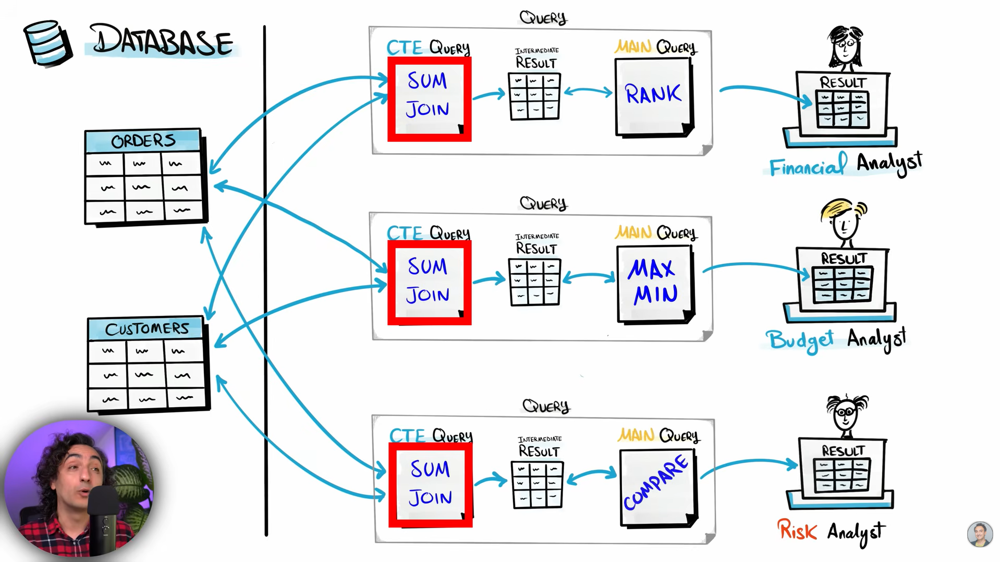

##### 2. VIEW Process : 

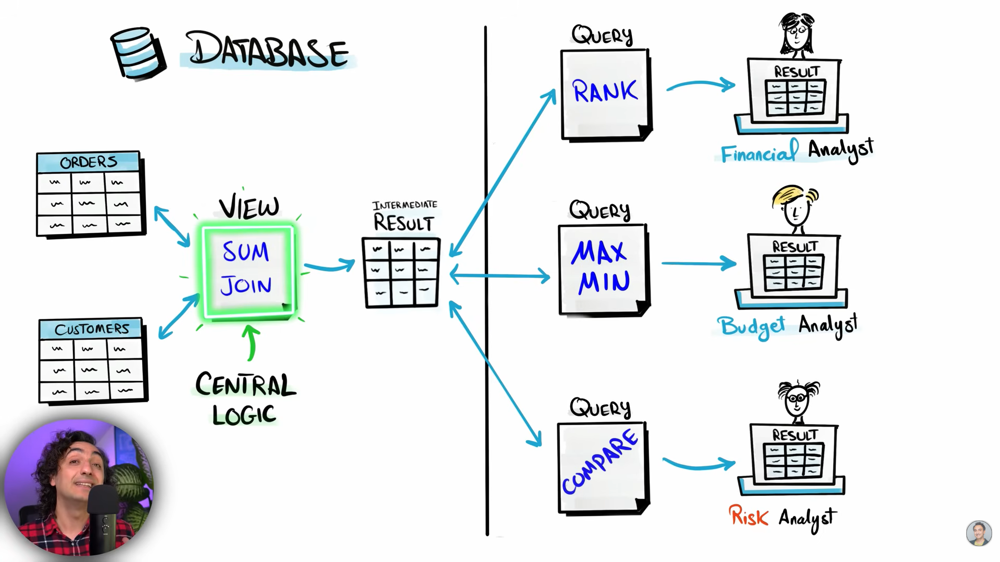

#### Challenges : 

##### 1. Create a VIEW that includes Total Sales and Total Quantity and Total Orders and it all should be in Monthwise

In [127]:
%%sql
CREATE OR REPLACE VIEW UC_Monthly_Summary AS (
    SELECT MONTHNAME(orderdate) AS Months,
    SUM(sales) AS TotalSales,
    COUNT(orderid) AS TotalOrders,
    SUM(quantity) AS TotalQuantity
    FROM orders
    GROUP BY MONTHNAME(orderdate)
);

Running query in 'mysql+pymysql://'

++
||
++
++

##### 2. Fetch all records from newly created view.

In [129]:
%%sql
select * from UC_Monthly_Summary;

Running query in 'mysql+pymysql://'

3 rows affected.

Months,TotalSales,TotalOrders,TotalQuantity
January,105,4,6
February,195,4,8
March,80,2,2


##### UC1 : 3. Calculate Running Sales by each months

In [156]:
%%sql
select Months,
    TotalSales,
    TotalOrders,
    TotalQuantity,
    SUM(TotalSales) OVER(
        order by MonthNum
    ) AS RunningSales
from(
        select *,
            CASE
                WHEN Months = 'January' THEN 1
                WHEN Months = 'February' THEN 2
                WHEN Months = 'March' THEN 3
            END as MonthNum
        from UC_Monthly_Summary
    ) as FinalTable;

Running query in 'mysql+pymysql://'

3 rows affected.

Months,TotalSales,TotalOrders,TotalQuantity,RunningSales
January,105,4,6,105
February,195,4,8,300
March,80,2,2,380


##### UC2 : 4. Calculate RANK of each Months by TotalSales of each Month from high to low

In [153]:
%%sql
select *, RANK() OVER(ORDER BY TotalSales DESC) AS MonthlySalesRank from UC_Monthly_Summary;

Running query in 'mysql+pymysql://'

3 rows affected.

Months,TotalSales,TotalOrders,TotalQuantity,MonthlySalesRank
February,195,4,8,1
January,105,4,6,2
March,80,2,2,3


### 2. Hide Complexity : 

#### Intro : 

##### What it means Hide Complexity?

Hide Complexity : 
1. Hide the complexity of database tables
2. Improve level of ABSTRACTION
3. Offers user more friendly and easy to comsume objects

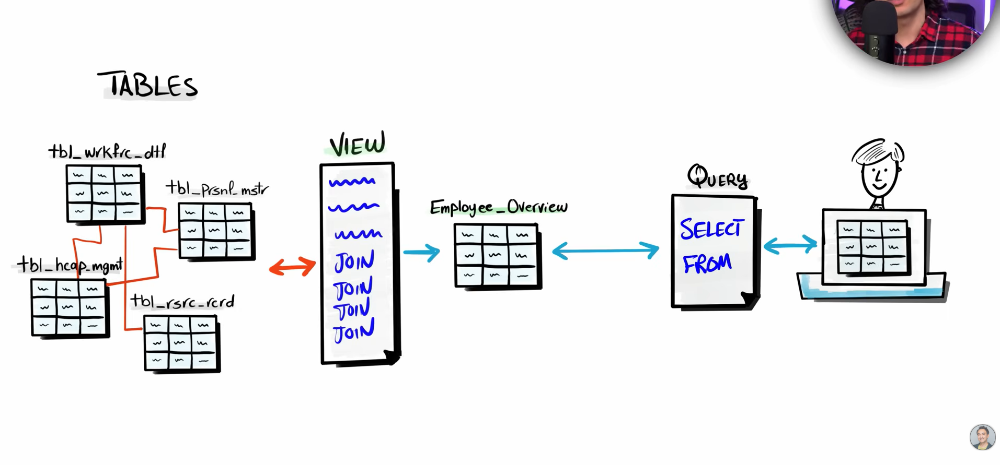

#### Challenges : 

##### 1. Provide the VIEW that combines details from orders, products, customers, employees.

In [168]:
%%sql
CREATE OR REPLACE VIEW OrderDetails as (
select o.orderid,
    o.orderdate,
    o.shipdate,
    o.orderstatus,
    o.shipaddress,
    o.billaddress,
    o.quantity,
    p.product,
    p.category,
    p.price,
    concat_ws(' ', c.firstname, c.lastname) as Customer,
    c.country,
    concat_ws(' ', e.firstname, e.lastname) as SalesPerson,
    e.Department
from orders as o
    left join products as p on o.productid = p.productid
    left join customers as c on o.customerid = c.customerid
    left join employees as e on o.salespersonid = e.employeeid)

Running query in 'mysql+pymysql://'

++
||
++
++

In [170]:
%%sql
-- HERE it HIDES all complexity
select * from OrderDetails;

Running query in 'mysql+pymysql://'

10 rows affected.

orderid,orderdate,shipdate,orderstatus,shipaddress,billaddress,quantity,product,category,price,Customer,country,SalesPerson,Department
1,2025-01-01,2025-01-05,Delivered,9833 Mt. Dias Blv.,1226 Shoe St.,1,Bottle,Accessories,10,Kevin Brown,USA,Mary,Sales
2,2025-01-05,2025-01-10,Shipped,250 Race Court,None,1,Tire,Accessories,15,Mary,USA,Mary,Sales
3,2025-01-10,2025-01-25,Delivered,8157 W. Book,8157 W. Book,2,Bottle,Accessories,10,Jossef Goldberg,Germany,Carol Baker,Sales
4,2025-01-20,2025-01-25,Shipped,5724 Victory Lane,,2,Gloves,Clothing,30,Jossef Goldberg,Germany,Mary,Sales
5,2025-02-01,2025-02-05,Delivered,None,None,1,Caps,Clothing,25,Kevin Brown,USA,Carol Baker,Sales
6,2025-02-05,2025-02-10,Delivered,1792 Belmont Rd.,None,2,Caps,Clothing,25,Mary,USA,Carol Baker,Sales
7,2025-02-15,2025-02-27,Delivered,136 Balboa Court,,2,Tire,Accessories,15,Jossef Goldberg,Germany,Frank Lee,Marketing
8,2025-02-18,2025-02-27,Shipped,2947 Vine Lane,4311 Clay Rd,3,Bottle,Accessories,10,Mark Schwarz,Germany,Mary,Sales
9,2025-03-10,2025-03-15,Shipped,3768 Door Way,,2,Bottle,Accessories,10,Kevin Brown,USA,Mary,Sales
10,2025-03-15,2025-03-20,Shipped,None,None,0,Tire,Accessories,15,Mary,USA,Carol Baker,Sales


### 3. Data Security : 

#### Intro : 

##### Use VIEWS to enforce security and protects sensitive data, by hiding column and/or rows from tables.

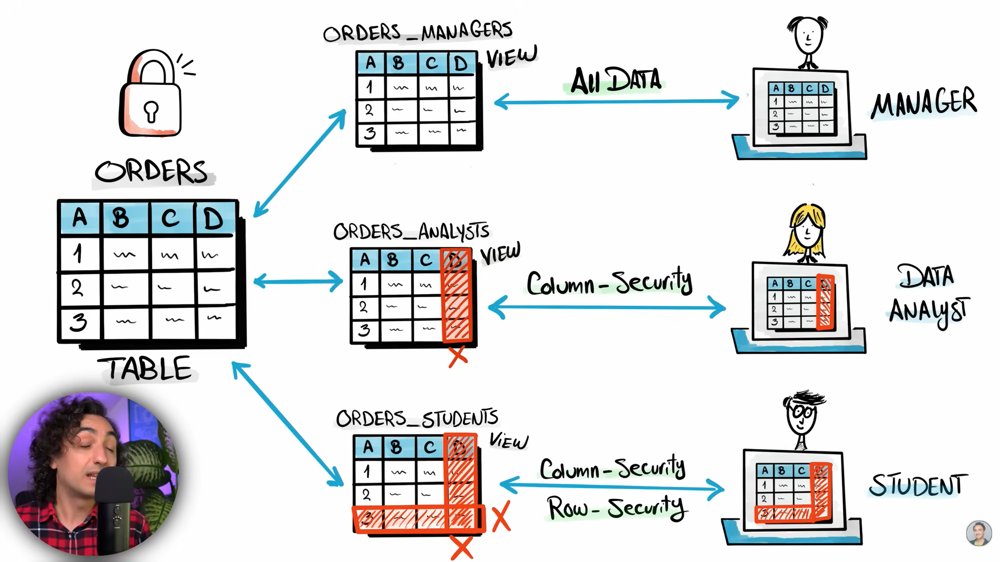

#### Challenges : 

##### 1. Provide a view for EU Sales team that combines details from all tables and excludes data related to USA.

In [175]:
%%sql
CREATE OR REPLACE VIEW EU_Sales AS(
        select o.orderid,
            o.orderdate,
            o.shipdate,
            o.orderstatus,
            o.shipaddress,
            o.billaddress,
            o.quantity,
            o.sales,
            o.creationtime,
            c.customerid,
            concat_ws(' ', c.firstname, c.lastname) as Customer,
            c.country,
            c.score,
            p.productid,
            p.product,
            p.category,
            p.price,
            e.employeeid,
            concat_ws(' ', e.firstname, e.lastname) as Employee,
            e.department,
            e.birthdate,
            e.gender,
            e.salary,
            e.managerid
        from orders as o
            left join products as p on p.productid = o.productid
            left join customers as c on c.customerid = o.customerid
            left join employees as e on e.employeeid = o.salespersonid
        where c.country != 'USA'
    );

Running query in 'mysql+pymysql://'

++
||
++
++

In [177]:
%%sql
-- Combined table for EU Sales Team that only hold EU data.
select * from EU_Sales;

Running query in 'mysql+pymysql://'

4 rows affected.

orderid,orderdate,shipdate,orderstatus,shipaddress,billaddress,quantity,sales,creationtime,customerid,Customer,country,score,productid,product,category,price,employeeid,Employee,department,birthdate,gender,salary,managerid
3,2025-01-10,2025-01-25,Delivered,8157 W. Book,8157 W. Book,2,20,2025-01-10 18:24:08,1,Jossef Goldberg,Germany,350,101,Bottle,Accessories,10,5,Carol Baker,Sales,1982-02-11,F,55000,3
4,2025-01-20,2025-01-25,Shipped,5724 Victory Lane,,2,60,2025-01-20 05:50:33,1,Jossef Goldberg,Germany,350,105,Gloves,Clothing,30,3,Mary,Sales,1986-01-05,F,75000,1
7,2025-02-15,2025-02-27,Delivered,136 Balboa Court,,2,30,2025-02-16 06:22:01,1,Jossef Goldberg,Germany,350,102,Tire,Accessories,15,1,Frank Lee,Marketing,1988-12-05,M,55000,None
8,2025-02-18,2025-02-27,Shipped,2947 Vine Lane,4311 Clay Rd,3,90,2025-02-18 10:45:22,4,Mark Schwarz,Germany,500,101,Bottle,Accessories,10,3,Mary,Sales,1986-01-05,F,75000,1


### 4. Flexibility & Dynamic : 

#### Problem : 

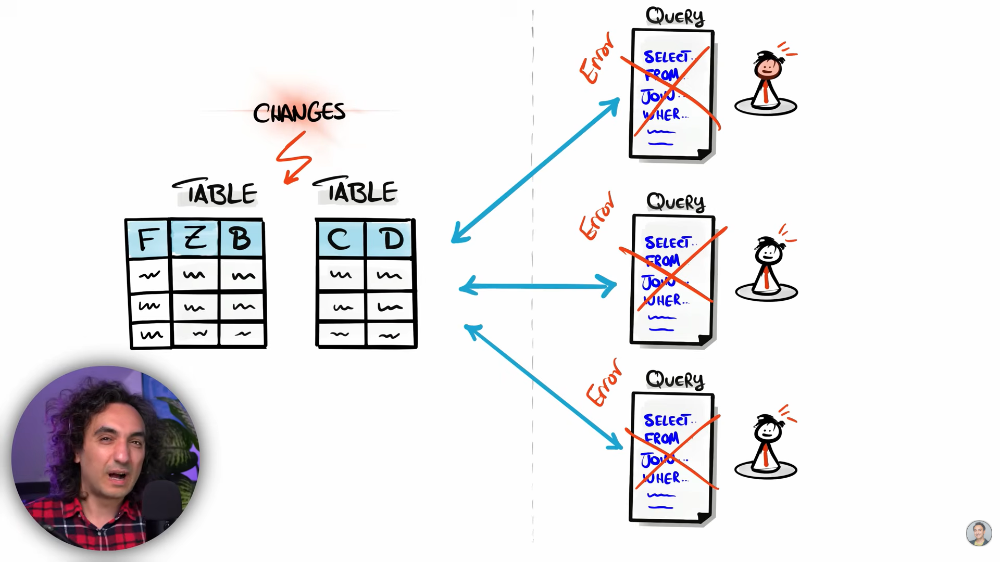

#### Solution : 

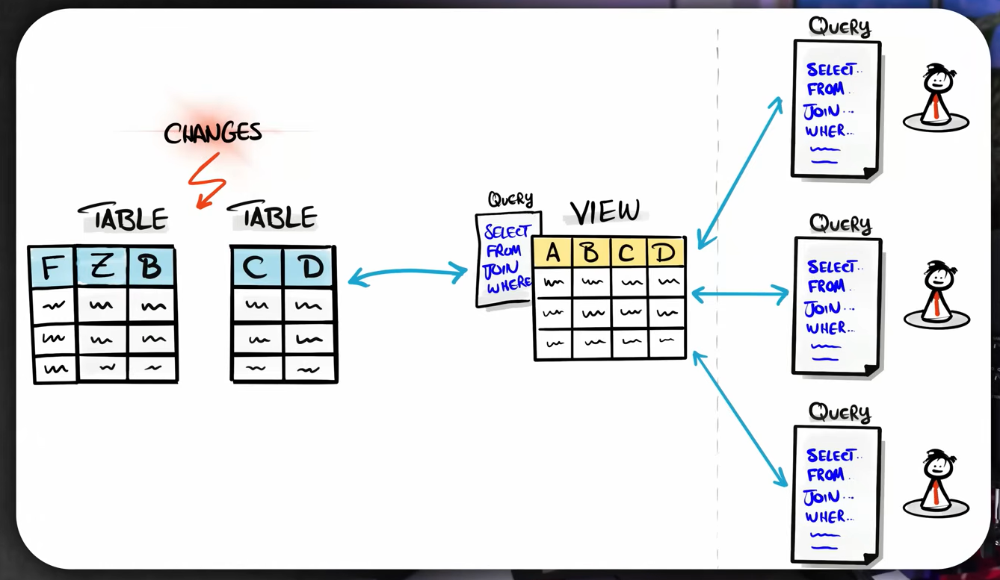

### 5. Multiple Languages : 

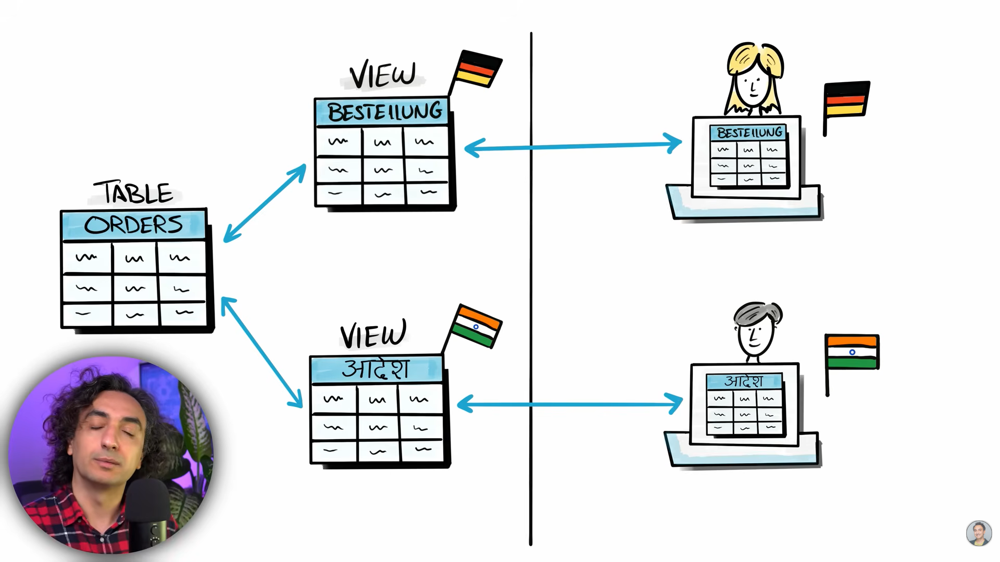

### 6. Virtual Data Marts in DWH : 

#### View can be used as Data Marts in Data WareHouse System because they provide a flexible and efficient way to prersent data

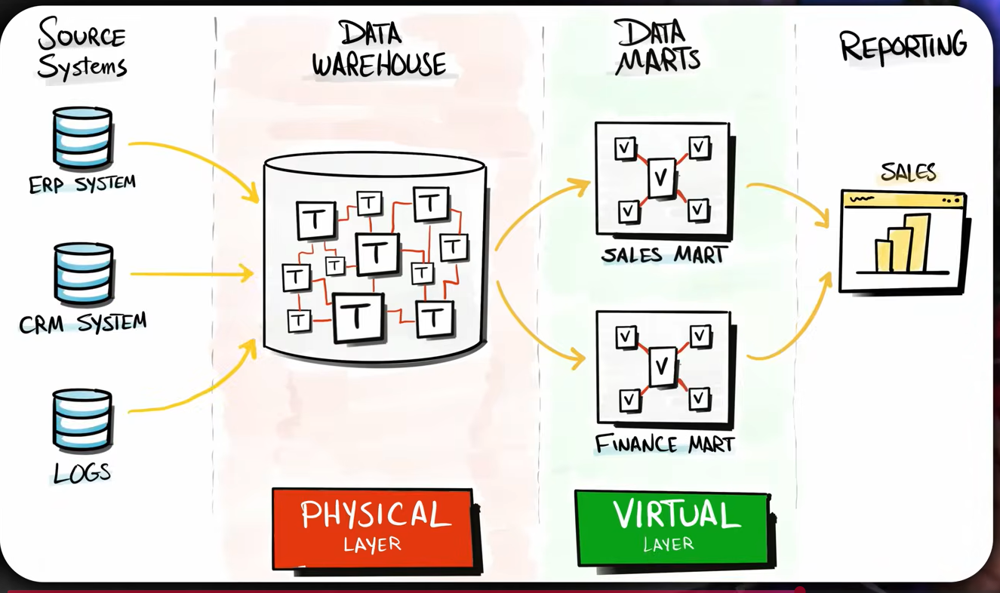

## SUMMARY : 

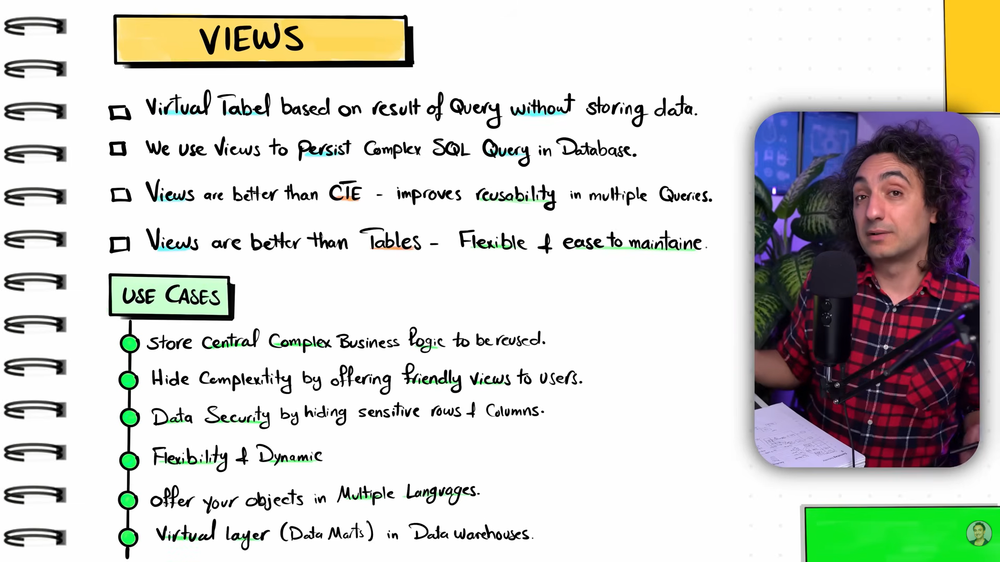

# Extra :

In [2]:
%%sql
use salesdb;

Running query in 'mysql+pymysql://'

++
||
++
++

In [1]:
%%sql
show databases;

Running query in 'mysql+pymysql://'

7 rows affected.

Database
MyDatabase
defaultdb
information_schema
mysql
performance_schema
salesdb
sys
